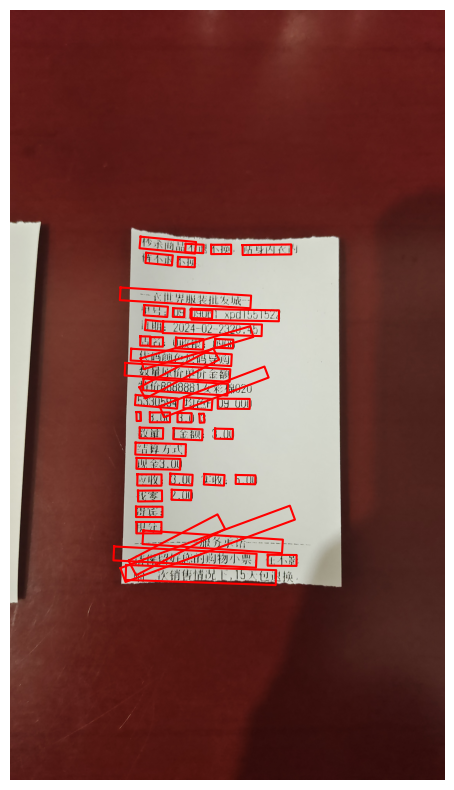

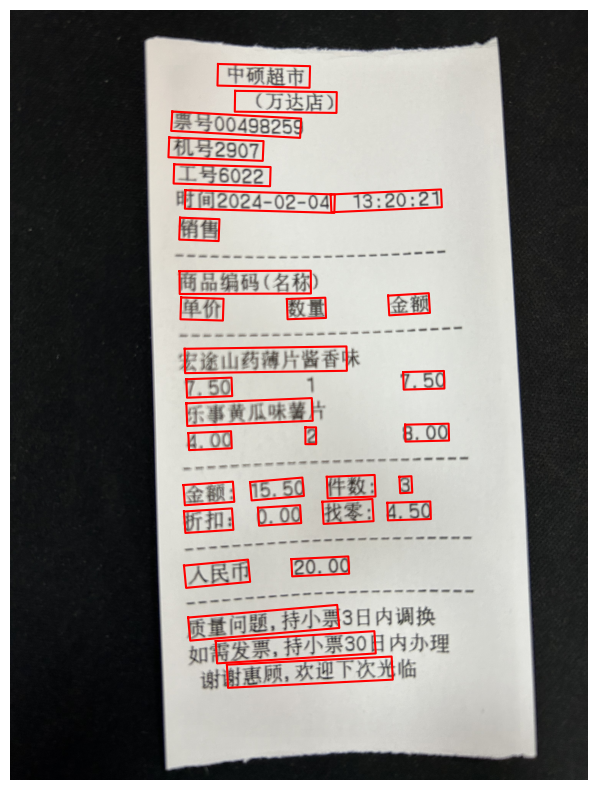

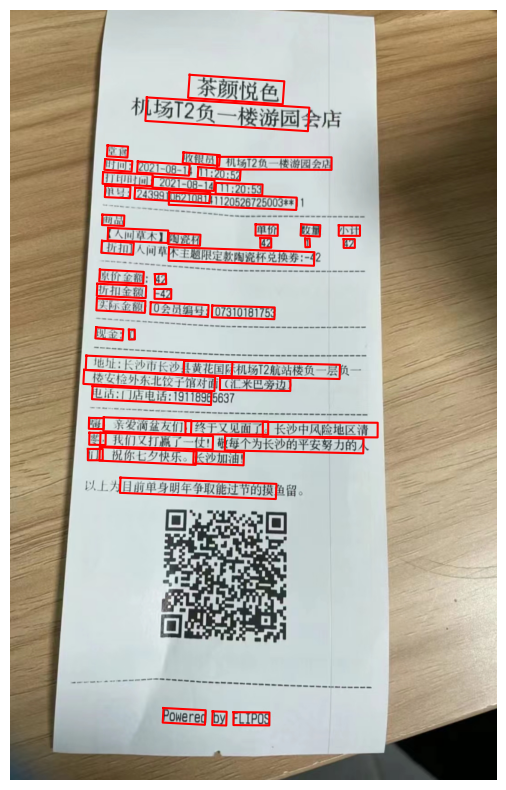

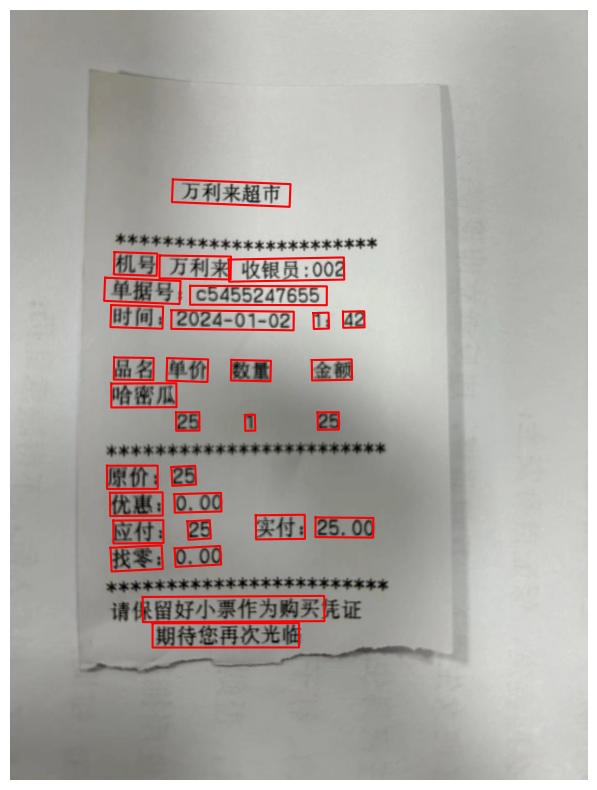

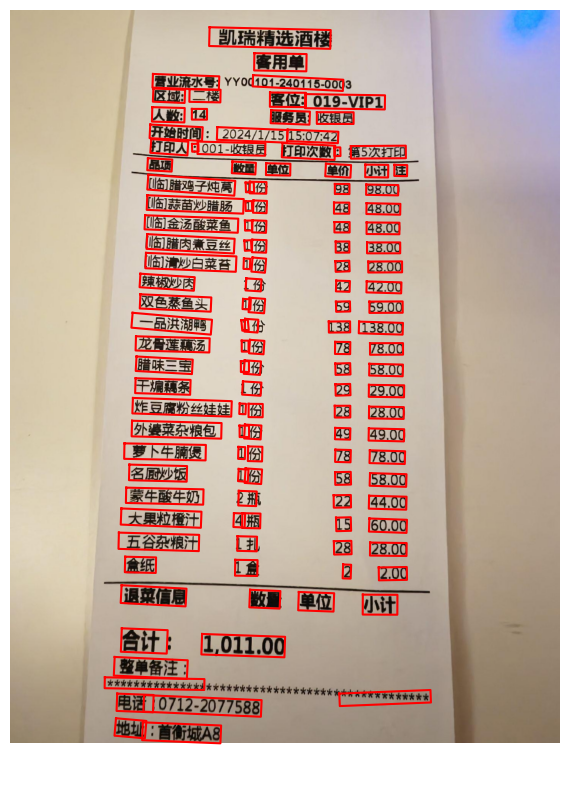

...

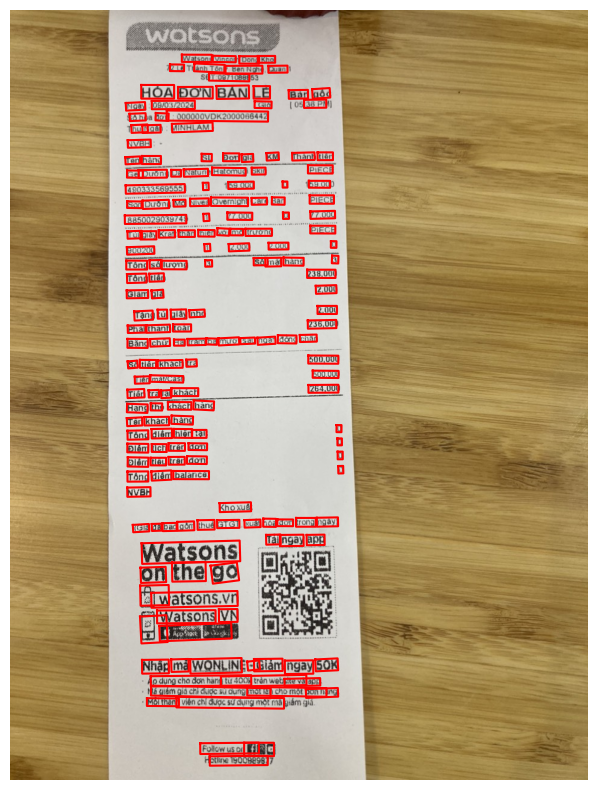

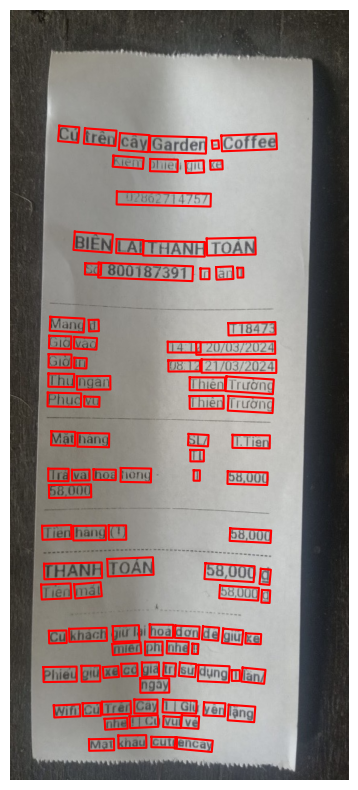

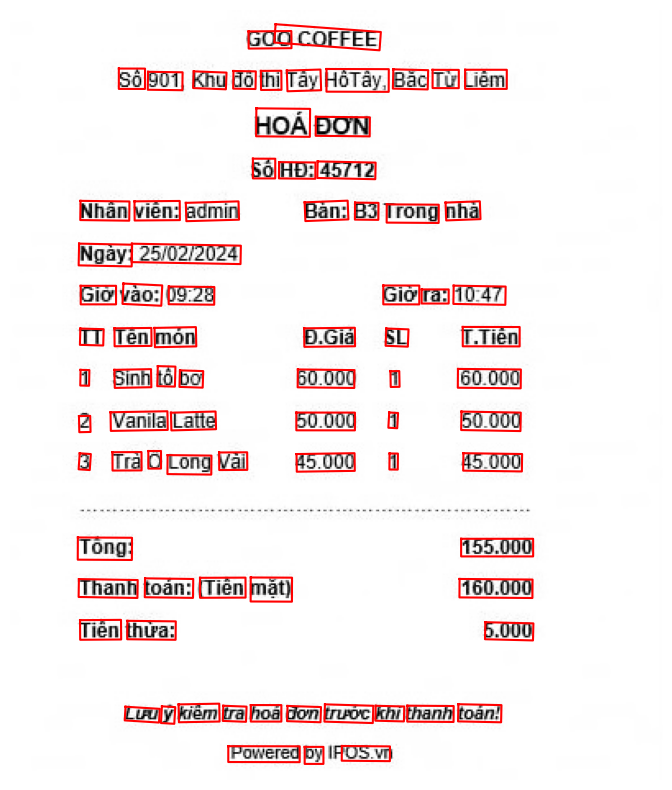

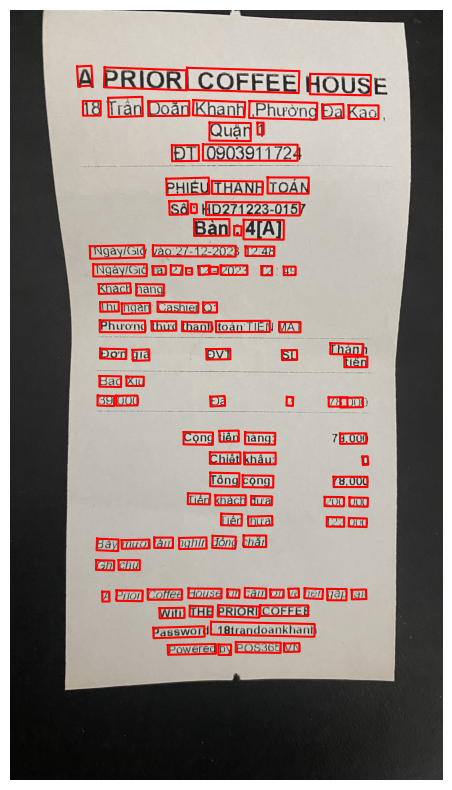

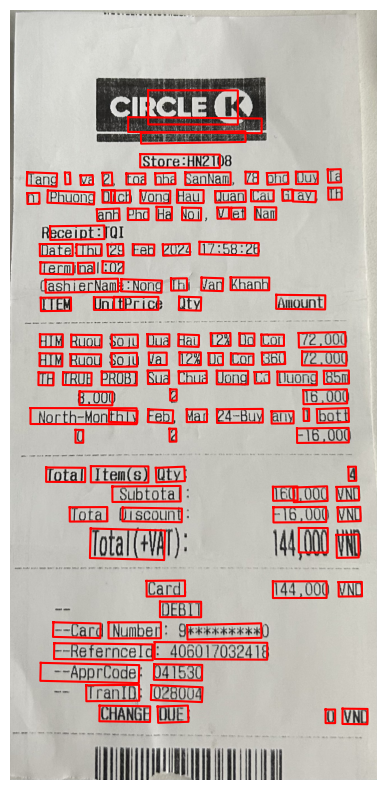

In [1]:
import json
import cv2
import os
import matplotlib.pyplot as plt

# JSON 파일과 이미지 폴더 경로 설정
json_path = '/data/ephemeral/utils/120epoch.json'
base_image_folder = '/data/ephemeral/data/'

# JSON 파일 로드
with open(json_path, 'r', encoding='utf-8') as f:
    data = json.load(f)

# 언어별 폴더 순회
languages = ['chinese_receipt', 'japanese_receipt', 'thai_receipt', 'vietnamese_receipt']
for lang in languages:
    image_folder = os.path.join(base_image_folder, lang, 'img', 'test')
    
    # 각 언어별 이미지 5장만 표시
    displayed_count = 0
    for image_file in os.listdir(image_folder):
        if displayed_count >= 5:
            break  # 언어별로 최대 5장만 표시

        image_path = os.path.join(image_folder, image_file)

        # 이미지 파일명만 추출하여 JSON에서 찾기
        if image_file not in data['images']:
            continue  # JSON에 없는 이미지는 넘어감
        
        # 이미지 로드
        image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # JSON 데이터 가져오기
        image_data = data['images'][image_file]['words']

        # 이미지 시각화
        plt.figure(figsize=(10, 10))
        plt.imshow(image_rgb)

        # 각 BBox를 이미지 위에 겹쳐 표시
        for word_id, word_info in image_data.items():
            points = word_info['points']
            
            # 각 점을 순서대로 연결하여 BBox 그리기
            x_coords = [p[0] for p in points] + [points[0][0]]  # 시작점으로 돌아와서 사각형을 닫음
            y_coords = [p[1] for p in points] + [points[0][1]]
            plt.plot(x_coords, y_coords, color='red')

        plt.axis('off')
        plt.show()

        # 표시된 이미지 카운트 증가
        displayed_count += 1
